In [2]:
import pandas as pd


from google.colab import files
uploaded = files.upload()

Saving online_retail_II.csv to online_retail_II.csv


In [3]:


# Load the dataset
df = pd.read_csv('online_retail_II.csv' , encoding='ISO-8859-1', delimiter=',')
# Display the column names print(df.columns)
print(df.columns)

Index(['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'Price', 'Customer ID', 'Country'],
      dtype='object')


In [4]:


# Create "Total price" column
df['Total price'] = df['Price'] * df['Quantity']

# Clean up the date column and convert to proper date format mm/dd/yyyy
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate']).dt.strftime('%m/%d/%Y')

# Display the first few rows to confirm changes
print(df.head())


  Invoice StockCode                          Description  Quantity  \
0  536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1  536365     71053                  WHITE METAL LANTERN         6   
2  536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3  536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4  536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   

  InvoiceDate  Price  Customer ID         Country  Total price  
0  12/01/2010   2.55      17850.0  United Kingdom        15.30  
1  12/01/2010   3.39      17850.0  United Kingdom        20.34  
2  12/01/2010   2.75      17850.0  United Kingdom        22.00  
3  12/01/2010   3.39      17850.0  United Kingdom        20.34  
4  12/01/2010   3.39      17850.0  United Kingdom        20.34  


In [5]:
# Calculate the total number of transactions
total_transactions = df['Invoice'].nunique()
print(f"Total Number of Transactions: {total_transactions}")


Total Number of Transactions: 25900


In [6]:
# Calculate the total number of Customers
total_customers = df['Customer ID'].nunique()
print(f"Total Number of Unique Customers: {total_customers}")

Total Number of Unique Customers: 4372


In [7]:
# Aggregate the dataset
df_customer = df.groupby(['Customer ID', 'Country', 'StockCode', 'Description']).agg({
    'Quantity': 'sum',
    'Total price': 'sum'
}).reset_index()

# Display the first few rows of the aggregated dataframe
print(df_customer.head())


   Customer ID         Country StockCode                          Description  \
0      12346.0  United Kingdom     23166       MEDIUM CERAMIC TOP STORAGE JAR   
1      12347.0         Iceland     16008  SMALL FOLDING SCISSOR(POINTED EDGE)   
2      12347.0         Iceland     17021               NAMASTE SWAGAT INCENSE   
3      12347.0         Iceland     20665                 RED RETROSPOT PURSE    
4      12347.0         Iceland     20719               WOODLAND CHARLOTTE BAG   

   Quantity  Total price  
0         0          0.0  
1        24          6.0  
2        36         10.8  
3         6         17.7  
4        40         34.0  


In [8]:
# Convert InvoiceDate to datetime format for extraction of calendar week and month
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], format='%m/%d/%Y')

# Extract calendar week and calendar month
df['Calendar Week'] = df['InvoiceDate'].dt.isocalendar().week
df['Calendar Month'] = df['InvoiceDate'].dt.month
df['Calendar Year'] = df['InvoiceDate'].dt.year
# Create a new dataframe
df_time = df.groupby(['Customer ID', 'Country', 'StockCode', 'Calendar Week', 'Calendar Month', 'Calendar Year']).agg({
    'Total price': 'sum'
}).reset_index()

# Display the first few rows of the new dataframe
print(df_time.head())


   Customer ID         Country StockCode  Calendar Week  Calendar Month  \
0      12346.0  United Kingdom     23166              3               1   
1      12347.0         Iceland     16008             14               4   
2      12347.0         Iceland     17021             23               6   
3      12347.0         Iceland     20665             14               4   
4      12347.0         Iceland     20719              4               1   

   Calendar Year  Total price  
0           2011          0.0  
1           2011          6.0  
2           2011         10.8  
3           2011         17.7  
4           2011          8.5  


     Country  Total price
0  Australia    137077.27
1    Austria     10154.32
2    Bahrain       548.40
3    Belgium     40910.96
4     Brazil      1143.60


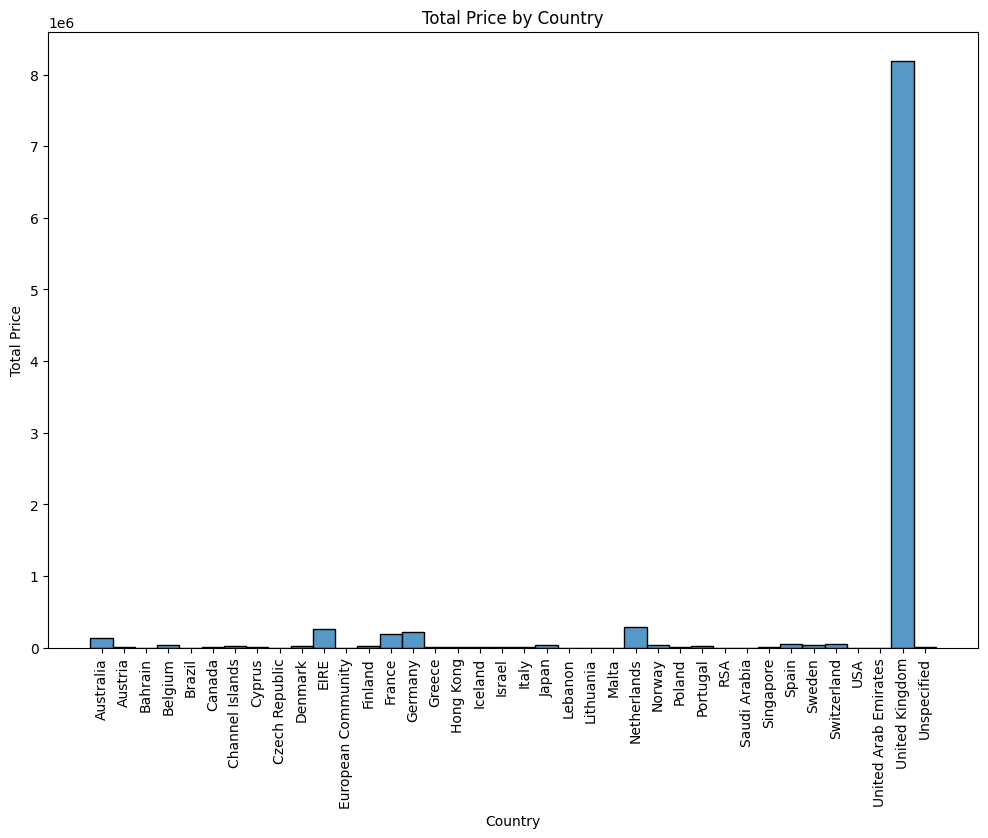

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Aggregate the Total Price by Country for the histogram
df_country = df.groupby('Country').agg({'Total price': 'sum'}).reset_index()

# Display the aggregated table
print(df_country.head())

# Plot the histogram using Seaborn
plt.figure(figsize=(12, 8))
sns.histplot(data=df_country, x='Country', weights='Total price', bins=30)
plt.xticks(rotation=90)
plt.xlabel('Country')
plt.ylabel('Total Price')
plt.title('Total Price by Country')
plt.show()


In [10]:
print(df_country)

                 Country  Total price
0              Australia   137077.270
1                Austria    10154.320
2                Bahrain      548.400
3                Belgium    40910.960
4                 Brazil     1143.600
5                 Canada     3666.380
6        Channel Islands    20086.290
7                 Cyprus    12946.290
8         Czech Republic      707.720
9                Denmark    18768.140
10                  EIRE   263276.820
11    European Community     1291.750
12               Finland    22326.740
13                France   197421.900
14               Germany   221698.210
15                Greece     4710.520
16             Hong Kong    10117.040
17               Iceland     4310.000
18                Israel     7907.820
19                 Italy    16890.510
20                 Japan    35340.620
21               Lebanon     1693.880
22             Lithuania     1661.060
23                 Malta     2505.470
24           Netherlands   284661.540
25          

In [11]:

# Aggregate the data by Country, Calendar Year, and Calendar Month
df_aggregated = df.groupby(['Country', 'Calendar Year', 'Calendar Month']).agg({
    'Total price': 'sum'
}).reset_index()

# Identify the top countries by total price
top_countries = df_aggregated.groupby('Country')['Total price'].sum().nlargest(10).index

# Filter the dataframe to include only the top countries
df_top_countries = df_aggregated[df_aggregated['Country'].isin(top_countries)]

# Create a pivot table for the heat map
heatmap_data = df_top_countries.pivot_table(
    values='Total price',
    index=['Country'],
    columns=['Calendar Year', 'Calendar Month'],
    aggfunc='sum'
)

# Fill NaN values with 0 for better visualization
heatmap_data = heatmap_data.fillna(0)

# Display the pivot table
print(heatmap_data)


Calendar Year        2010       2011                                    \
Calendar Month         12         1          2          3           4    
Country                                                                  
Australia         1005.10    9017.71   14627.47   17055.29     333.400   
Belgium           1809.91    1154.05    2161.32    3333.58    1954.150   
EIRE              9029.95   21656.52    9674.14   18783.23    7570.500   
France            9575.36   17503.07    8438.91   14516.90    4195.210   
Germany          14562.84   16451.43    8969.24   14170.02   11963.370   
Netherlands       8784.48   26611.16   22932.11   22416.49    2976.560   
Spain             1843.73    7178.54    2093.70    5326.65    1785.650   
Sweden            2646.30    3446.32     509.50    4540.58     809.100   
Switzerland       1304.92    4231.23    2642.67    1870.23    1822.190   
United Kingdom  676742.62  434308.30  408247.91  559707.39  442254.041   

Calendar Year                        

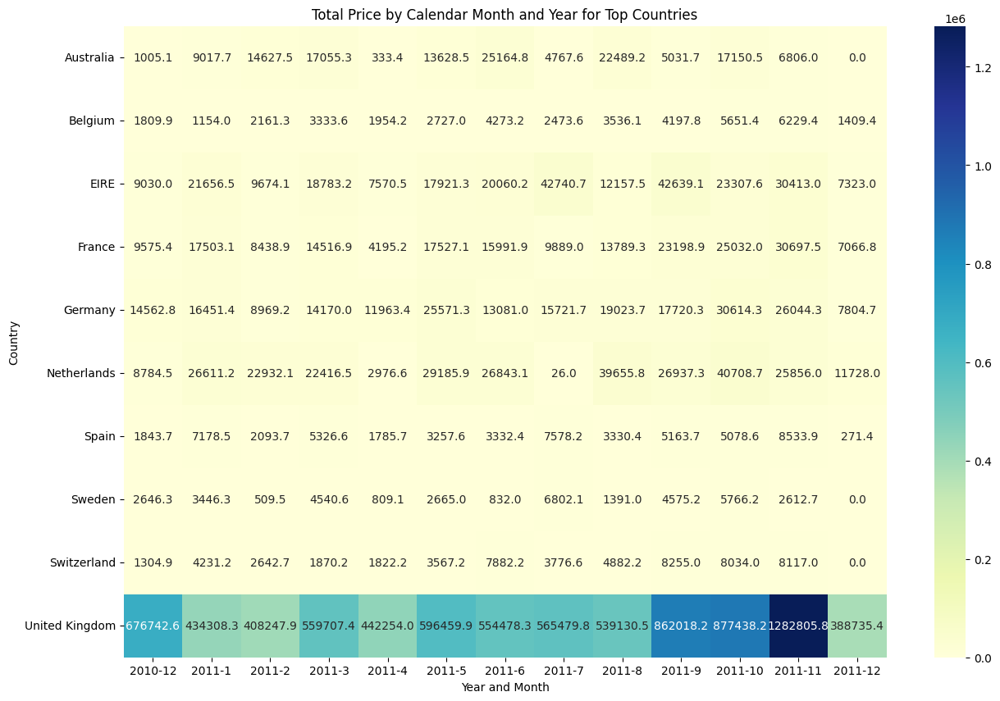

In [12]:
# Plot the heat map using Seaborn
plt.figure(figsize=(15, 10))
sns.heatmap(heatmap_data, annot=True, fmt='.1f', cmap='YlGnBu')
plt.xlabel('Year and Month')
plt.ylabel('Country')
plt.title('Total Price by Calendar Month and Year for Top Countries')
plt.show()


In [13]:
# Filter the dataset for United Kingdom
df_uk = df[df['Country'] == 'United Kingdom']
# Display the first few rows to confirm changes
print(df_uk.head())

  Invoice StockCode                          Description  Quantity  \
0  536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1  536365     71053                  WHITE METAL LANTERN         6   
2  536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3  536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4  536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   

  InvoiceDate  Price  Customer ID         Country  Total price  Calendar Week  \
0  2010-12-01   2.55      17850.0  United Kingdom        15.30             48   
1  2010-12-01   3.39      17850.0  United Kingdom        20.34             48   
2  2010-12-01   2.75      17850.0  United Kingdom        22.00             48   
3  2010-12-01   3.39      17850.0  United Kingdom        20.34             48   
4  2010-12-01   3.39      17850.0  United Kingdom        20.34             48   

   Calendar Month  Calendar Year  
0              12           2010  
1              12     

In [16]:
# Aggregate the data by Calendar Year and Calendar Month
df_uk_aggregated = df_uk.groupby(['Calendar Year', 'Calendar Month']).agg({
    'Total price': 'sum'
}).reset_index()

# Display the aggregated data
print(df_uk_aggregated.head())


   Calendar Year  Calendar Month  Total price
0           2010              12   676742.620
1           2011               1   434308.300
2           2011               2   408247.910
3           2011               3   559707.390
4           2011               4   442254.041


In [16]:
# Aggregate data to get the count of unique transactions (invoices) per Customer ID, Calendar Year, and Calendar Month
df_aggregated = df.groupby(['Customer ID', 'Calendar Year', 'Calendar Month']).agg({
    'Invoice': 'nunique'
}).reset_index()

# Rename the aggregated column for clarity
df_aggregated.rename(columns={'Invoice': 'Count of Invoice'}, inplace=True)

# Display the first few rows of the aggregated dataframe
print(df_aggregated.head())


   Customer ID  Calendar Year  Calendar Month  Count of Invoice
0      12346.0           2011               1                 2
1      12347.0           2010              12                 1
2      12347.0           2011               1                 1
3      12347.0           2011               4                 1
4      12347.0           2011               6                 1


In [17]:
# Create a pivot table to have 12 columns representing each month with aggregated values as Count of Invoice
df_customer_invoice_insight = df_aggregated.pivot_table(
    index=['Customer ID', 'Calendar Year'],
    columns='Calendar Month',
    values='Count of Invoice',
    fill_value=0
).reset_index()

# Rename the columns for better readability
df_customer_invoice_insight.columns = ['Customer ID', 'Calendar Year'] + [
    f'Month {month}' for month in range(1, 13)
]

# Display the final dataframe
print(df_customer_invoice_insight.head())


   Customer ID  Calendar Year  Month 1  Month 2  Month 3  Month 4  Month 5  \
0      12346.0           2011      2.0      0.0      0.0      0.0      0.0   
1      12347.0           2010      0.0      0.0      0.0      0.0      0.0   
2      12347.0           2011      1.0      0.0      0.0      1.0      0.0   
3      12348.0           2010      0.0      0.0      0.0      0.0      0.0   
4      12348.0           2011      1.0      0.0      0.0      1.0      0.0   

   Month 6  Month 7  Month 8  Month 9  Month 10  Month 11  Month 12  
0      0.0      0.0      0.0      0.0       0.0       0.0       0.0  
1      0.0      0.0      0.0      0.0       0.0       0.0       1.0  
2      1.0      0.0      1.0      0.0       1.0       0.0       1.0  
3      0.0      0.0      0.0      0.0       0.0       0.0       1.0  
4      0.0      0.0      0.0      1.0       0.0       0.0       0.0  


In [18]:

# Calculate Recency, Frequency, and Monetary
rfm_df = df.groupby('Customer ID').agg({
    'InvoiceDate': lambda x: (df['InvoiceDate'].max() - x.max()).days,
    'Invoice': 'nunique',
    'Total price': 'sum'
}).reset_index()

# Rename the columns
rfm_df.columns = ['Customer ID', 'Recency', 'Frequency', 'Monetary']

# Create segments based on quantiles, using duplicates='drop' to handle duplicate edges
rfm_df['R_Segment'] = pd.qcut(rfm_df['Recency'], 4, labels=[4, 3, 2, 1], duplicates='drop')
rfm_df['F_Segment'] = pd.qcut(rfm_df['Frequency'], 4, labels=[1, 2, 3, 4], duplicates='drop')
rfm_df['M_Segment'] = pd.qcut(rfm_df['Monetary'], 4, labels=[1, 2, 3, 4], duplicates='drop')

# Calculate RFM score
rfm_df['RFM_Score'] = rfm_df[['R_Segment', 'F_Segment', 'M_Segment']].sum(axis=1)

# Classify customers into segments
def rfm_classification(df):
    if df['RFM_Score'] >= 9:
        return 'High-Value'
    elif 5 <= df['RFM_Score'] < 9:
        return 'Medium-Value'
    else:
        return 'Low-Value'

rfm_df['Customer_Segment'] = rfm_df.apply(rfm_classification, axis=1)

# Display the segments
import plotly.express as px
fig = px.scatter(rfm_df, x='Recency', y='Monetary', color='Customer_Segment',
                 hover_data=['Customer ID', 'Frequency'], title='Customer Segmentation based on RFM')
fig.show()


ValueError: Bin labels must be one fewer than the number of bin edges

In [19]:
# Calculate Recency, Frequency, and Monetary
rfm_df = df.groupby('Customer ID').agg({
    'InvoiceDate': lambda x: (df['InvoiceDate'].max() - x.max()).days,
    'Invoice': 'nunique',
    'Total price': 'sum'
}).reset_index()

# Rename the columns
rfm_df.columns = ['Customer ID', 'Recency', 'Frequency', 'Monetary']

# Create segments based on quantiles
# Removed labels and duplicates='drop' to let pd.qcut automatically handle binning
rfm_df['R_Segment'] = pd.qcut(rfm_df['Recency'], 4, labels=[4, 3, 2, 1])
rfm_df['F_Segment'] = pd.qcut(rfm_df['Frequency'], 4, labels=[1, 2, 3, 4])
rfm_df['M_Segment'] = pd.qcut(rfm_df['Monetary'], 4, labels=[1, 2, 3, 4])

# Calculate RFM score
rfm_df['RFM_Score'] = rfm_df[['R_Segment', 'F_Segment', 'M_Segment']].sum(axis=1)

# Classify customers into segments
def rfm_classification(df):
    if df['RFM_Score'] >= 9:
        return 'High-Value'
    elif 5 <= df['RFM_Score'] < 9:
        return 'Medium-Value'
    else:
        return 'Low-Value'

rfm_df['Customer_Segment'] = rfm_df.apply(rfm_classification, axis=1)

# Display the segments
import plotly.express as px
fig = px.scatter(rfm_df, x='Recency', y='Monetary', color='Customer_Segment',
                 hover_data=['Customer ID', 'Frequency'], title='Customer Segmentation based on RFM')
fig.show()

ValueError: Bin edges must be unique: Index([1.0, 1.0, 3.0, 5.0, 248.0], dtype='float64', name='Frequency').
You can drop duplicate edges by setting the 'duplicates' kwarg

In [20]:
import pandas as pd

# Load the dataset
df = pd.read_csv('online_retail_II.csv', encoding='ISO-8859-1')

# Create "Total price" column
df['Total price'] = df['Price'] * df['Quantity']

# Convert InvoiceDate to datetime format
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Calculate Recency, Frequency, and Monetary
rfm_df = df.groupby('Customer ID').agg({
    'InvoiceDate': lambda x: (df['InvoiceDate'].max() - x.max()).days,
    'Invoice': 'nunique',
    'Total price': 'sum'
}).reset_index()

# Rename the columns
rfm_df.columns = ['Customer ID', 'Recency', 'Frequency', 'Monetary']

# Create segments based on quantiles, ensuring labels match bins
rfm_df['R_Segment'] = pd.qcut(rfm_df['Recency'].rank(method='first'), 4, labels=[4, 3, 2, 1], duplicates='drop')
rfm_df['F_Segment'] = pd.qcut(rfm_df['Frequency'].rank(method='first'), 4, labels=[1, 2, 3, 4], duplicates='drop')
rfm_df['M_Segment'] = pd.qcut(rfm_df['Monetary'].rank(method='first'), 4, labels=[1, 2, 3, 4], duplicates='drop')

# Calculate RFM score
rfm_df['RFM_Score'] = rfm_df[['R_Segment', 'F_Segment', 'M_Segment']].sum(axis=1)

# Classify customers into segments
def rfm_classification(df):
    if df['RFM_Score'] >= 9:
        return 'High-Value'
    elif 5 <= df['RFM_Score'] < 9:
        return 'Medium-Value'
    else:
        return 'Low-Value'

rfm_df['Customer_Segment'] = rfm_df.apply(rfm_classification, axis=1)
# Define the color palette for the segments
palette = {
    'High-Value': 'green',
    'Medium-Value': 'blue',
    'Low-Value': 'red'
}

# Display the segments
import plotly.express as px
fig = px.scatter(rfm_df, x='Recency', y='Monetary', color='Customer_Segment', color_discrete_map=palette,
                 hover_data=['Customer ID', 'Frequency'], title='Customer Segmentation based on RFM',
                 labels={ 'Recency': 'Recency (days since last purchase)', 'Frequency': 'Frequency (number of purchases)', 'Monetary': 'Monetary (total spent in $)' })
fig.show()


In [21]:
import plotly.express as px

# Define the color palette for the segments
palette = {
    'High-Value': 'green',
    'Medium-Value': 'blue',
    'Low-Value': 'red'
}

# Create 3-D scatter plot using Plotly with explanations
fig = px.scatter_3d(
    rfm_df,
    x='Recency',
    y='Frequency',
    z='Monetary',
    color='Customer_Segment',
    color_discrete_map=palette,
    title='3-D Scatter Plot: Recency vs Frequency vs Monetary by Customer Segment',
    labels={
        'Recency': 'Recency (days since last purchase)',
        'Frequency': 'Frequency (number of purchases)',
        'Monetary': 'Monetary (total spent in $)'
    }
)

fig.update_layout(
    scene = dict(
        xaxis_title='Recency (days since last purchase)',
        yaxis_title='Frequency (number of purchases)',
        zaxis_title='Monetary (total spent in $)'
    )
)

fig.show()


In [22]:
import plotly.express as px

# Define the color palette for the segments
palette = {
    'High-Value': 'green',
    'Medium-Value': 'blue',
    'Low-Value': 'red'
}

# Create 3-D scatter plot using Plotly
fig = px.scatter_3d(
    rfm_df,
    x='Recency',
    y='Frequency',
    z='Monetary',
    color='Customer_Segment',
    color_discrete_map=palette,
    title='3-D Scatter Plot: Recency vs Frequency vs Monetary by Customer Segment'
)

fig.show()


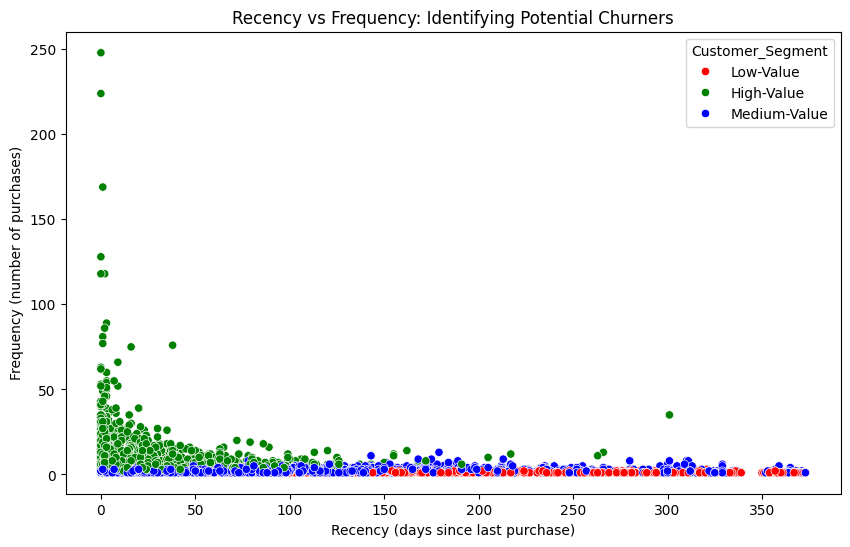

Correlation between Recency and Frequency:
            Recency  Frequency
Recency    1.000000  -0.259342
Frequency -0.259342   1.000000


In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate correlation between Recency and Frequency
correlation = rfm_df[['Recency', 'Frequency']].corr()

# Define the color palette for the segments
palette = {
    'High-Value': 'green',
    'Medium-Value': 'blue',
    'Low-Value': 'red'
}

# Plot scatter plot with custom colors
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=rfm_df,
    x='Recency',
    y='Frequency',
    hue='Customer_Segment',
    palette=palette
)
plt.title('Recency vs Frequency: Identifying Potential Churners')
plt.xlabel('Recency (days since last purchase)')
plt.ylabel('Frequency (number of purchases)')
plt.show()

print("Correlation between Recency and Frequency:")
print(correlation)


In [25]:
# Define the customer segment classification function with "-Value" suffix
def rfm_classification(df):
    if df['RFM_Score'] >= 9:
        return 'High-Value'
    elif 5 <= df['RFM_Score'] < 9:
        return 'Medium-Value'
    else:
        return 'Low-Value'

# Apply the classification to the RFM dataframe
rfm_df['Customer_Segment'] = rfm_df.apply(rfm_classification, axis=1)

# Display the first few rows to confirm the changes
print(rfm_df.head())


import seaborn as sns
import matplotlib.pyplot as plt

# Define the color palette for the segments
palette = {
    'High-Value': 'green',
    'Medium-Value': 'blue',
    'Low-Value': 'red'
}

# Merge the monthly data with the updated RFM data
df_merged = pd.merge(df_monthly, rfm_df[['Customer ID', 'Customer_Segment']], on='Customer ID', how='left')

# Plot the histogram using Seaborn with the specified colors
plt.figure(figsize=(14, 8))
sns.histplot(
    data=df_merged,
    x='Calendar Month',
    weights='Total price',
    hue='Customer_Segment',
    multiple='stack',
    palette=palette
)
plt.xlabel('Calendar Month')
plt.ylabel('Total Price')
plt.title('Distribution of Total Price by Calendar Month and Customer Segment')
plt.show()


   Customer ID  Recency  Frequency  Monetary R_Segment F_Segment M_Segment  \
0      12346.0      325          2      0.00         1         2         1   
1      12347.0        1          7   4310.00         4         4         4   
2      12348.0       74          4   1797.24         2         3         4   
3      12349.0       18          1   1757.55         3         1         4   
4      12350.0      309          1    334.40         1         1         2   

   RFM_Score Customer_Segment  
0          4        Low-Value  
1         12       High-Value  
2          9       High-Value  
3          8     Medium-Value  
4          4        Low-Value  


NameError: name 'df_monthly' is not defined

In [26]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, roc_auc_score, matthews_corrcoef, f1_score

# Prepare data
X = rfm_df[['Recency', 'Frequency', 'Monetary']]
y = rfm_df['Customer_Segment'].apply(lambda x: 1 if x == 'High-Value' else 0)  # Binary classification for simplicity

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize models
models = {
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Logistic Regression': LogisticRegression(),
    'Naive Bayes': GaussianNB(),
    'SVM (Radial)': SVC(kernel='rbf', probability=True),
    'SVM (Linear)': SVC(kernel='linear', probability=True),
    'K-Nearest Neighbors': KNeighborsClassifier()
}

# Evaluate models
results = []

for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    y_prob = model.predict_proba(X_test_scaled)[:, 1]

    accuracy = model.score(X_test_scaled, y_test)
    mcc = matthews_corrcoef(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    tpr = tp / (tp + fn)
    tnr = tn / (tn + fp)
    roc_auc = roc_auc_score(y_test, y_prob)

    results.append({
        'Model': name,
        'Accuracy': accuracy,
        'MCC': mcc,
        'F1 Score': f1,
        'TP Rate': tpr,
        'TN Rate': tnr,
        'ROC AUC': roc_auc
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Display results
print(results_df)


                 Model  Accuracy       MCC  F1 Score   TP Rate   TN Rate  \
0        Random Forest  0.996571  0.992791  0.995595  0.994135  0.998127   
1        Decision Tree  0.994286  0.988032  0.992701  0.997067  0.992509   
2    Gradient Boosting  0.996571  0.992807  0.995582  0.991202  1.000000   
3  Logistic Regression  0.964571  0.925381  0.953938  0.941349  0.979401   
4          Naive Bayes  0.881143  0.759503  0.822526  0.706745  0.992509   
5         SVM (Radial)  0.969143  0.935025  0.960118  0.953079  0.979401   
6         SVM (Linear)  0.971429  0.939906  0.963289  0.961877  0.977528   
7  K-Nearest Neighbors  0.976000  0.949490  0.969072  0.964809  0.983146   

    ROC AUC  
0  0.999967  
1  0.994788  
2  0.999995  
3  0.993410  
4  0.988467  
5  0.994964  
6  0.993904  
7  0.998622  


In [27]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, chi2, f_classif
from scipy.stats import shapiro, pearsonr
import seaborn as sns
import matplotlib.pyplot as plt


# Create "Total price" column
df['Total price'] = df['Price'] * df['Quantity']

# Convert InvoiceDate to datetime format
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Extract relevant features
features = df[['Quantity', 'Price', 'Total price', 'Customer ID']]
# Ensure no missing values for the feature selection
features = features.dropna()

# Display the first few rows to confirm changes
print(features.head())


   Quantity  Price  Total price  Customer ID
0         6   2.55        15.30      17850.0
1         6   3.39        20.34      17850.0
2         8   2.75        22.00      17850.0
3         6   3.39        20.34      17850.0
4         6   3.39        20.34      17850.0


In [28]:
# Define the target variable
y = features['Customer ID']

# Drop the target variable from features
X = features.drop(columns='Customer ID')

# Normalize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform feature ranking using SelectKBest
selector = SelectKBest(score_func=chi2, k='all')
selector.fit(X_scaled, y)
scores = selector.scores_

# Create a DataFrame to display feature rankings
feature_ranking = pd.DataFrame({'Feature': X.columns, 'Score': scores}).sort_values(by='Score', ascending=False)
print(feature_ranking)


ValueError: Input X must be non-negative.

In [29]:
# Define the target variable
y = features['Customer ID']

# Drop the target variable from features
X = features.drop(columns='Customer ID')

# Normalize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform feature ranking using SelectKBest with f_classif
selector = SelectKBest(score_func=f_classif, k='all')
selector.fit(X_scaled, y)
scores = selector.scores_

# Create a DataFrame to display feature rankings
feature_ranking = pd.DataFrame({'Feature': X.columns, 'Score': scores}).sort_values(by='Score', ascending=False)
print(feature_ranking)


       Feature      Score
1        Price  20.738506
0     Quantity   1.577028
2  Total price   0.839104


In [30]:
# Define the target variable
y = features['Customer ID']

# Drop the target variable from features
X = features.drop(columns='Customer ID')

# Normalize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform feature ranking using SelectKBest with f_classif
selector = SelectKBest(score_func=f_classif, k='all')
selector.fit(X_scaled, y)
scores = selector.scores_

# Create a DataFrame to display feature rankings
feature_ranking = pd.DataFrame({'Feature': X.columns, 'Score': scores}).sort_values(by='Score', ascending=False)
print(feature_ranking)


       Feature      Score
1        Price  20.738506
0     Quantity   1.577028
2  Total price   0.839104


In [38]:
# Perform Shapiro-Wilk test for normality on 'Total price'
shapiro_test = shapiro(features['Total price'])
print("Shapiro-Wilk Test for Total price:", shapiro_test)


Shapiro-Wilk Test for Total price: ShapiroResult(statistic=0.008294670810003124, pvalue=5.406400720797282e-221)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 406830.



As the above warning indicates since N > 5000

In [31]:
from scipy.stats import kstest

# Perform Kolmogorov-Smirnov test for normality on 'Total price'
ks_test = kstest(features['Total price'], 'norm', args=(features['Total price'].mean(), features['Total price'].std()))
print("Kolmogorov-Smirnov Test for Total price:", ks_test)


Kolmogorov-Smirnov Test for Total price: KstestResult(statistic=0.46279759457798253, pvalue=0.0, statistic_location=-5.1, statistic_sign=-1)


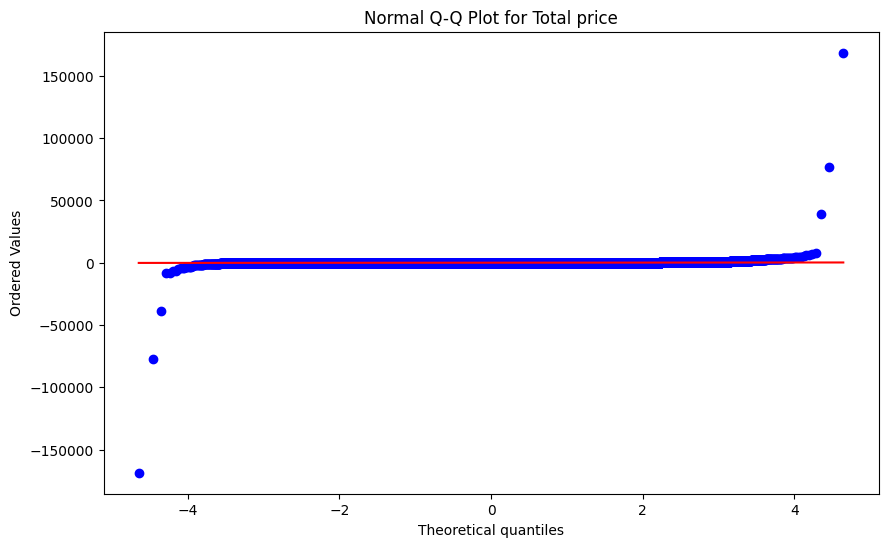

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats

# Create a Q-Q plot
plt.figure(figsize=(10, 6))
stats.probplot(features['Total price'], dist="norm", plot=plt)
plt.title('Normal Q-Q Plot for Total price')
plt.show()


In [33]:
# Calculate Pearson correlation coefficient between 'Quantity' and 'Total price'
pearson_corr, p_value = pearsonr(features['Quantity'], features['Total price'])
print("Pearson Correlation Coefficient between Quantity and Total price:", pearson_corr)
print("P-value:", p_value)


Pearson Correlation Coefficient between Quantity and Total price: 0.9160960304885194
P-value: 0.0


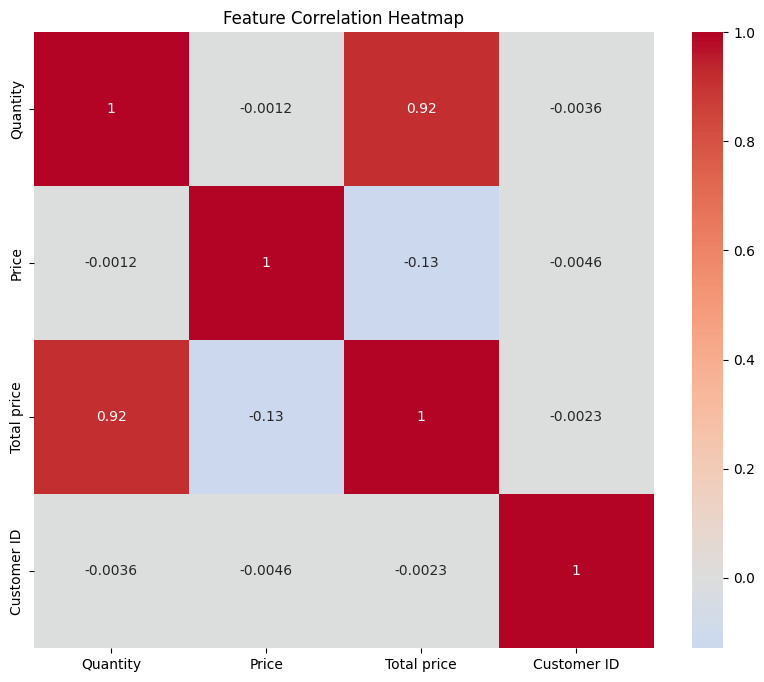

In [34]:
# Plot correlation heatmap
plt.figure(figsize=(10, 8))
correlation_matrix = features.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Feature Correlation Heatmap')
plt.show()


In [35]:
import plotly.express as px

# Scatter plot for Quantity vs Total price
fig = px.scatter(features, x='Quantity', y='Total price', title='Quantity vs Total price Scatter Plot')
fig.show()


In [36]:
import pandas as pd
import numpy as np

# Load the dataset
df = pd.read_csv('online_retail_II.csv', encoding='ISO-8859-1')

# Create "Total price" column
df['Total price'] = df['Price'] * df['Quantity']

# Convert InvoiceDate to datetime format
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Extract calendar month and calendar year
df['Calendar Month'] = df['InvoiceDate'].dt.month
df['Calendar Year'] = df['InvoiceDate'].dt.year

# Aggregate data by Customer ID, Calendar Year, and Calendar Month
df_monthly = df.groupby(['Customer ID', 'Calendar Year', 'Calendar Month']).agg({
    'Invoice': 'nunique',
    'Total price': 'sum'
}).reset_index()

# Merge with RFM scores and segments
rfm_df = df.groupby('Customer ID').agg({
    'InvoiceDate': lambda x: (df['InvoiceDate'].max() - x.max()).days,
    'Invoice': 'nunique',
    'Total price': 'sum'
}).reset_index()

# Rename the columns
rfm_df.columns = ['Customer ID', 'Recency', 'Frequency', 'Monetary']

# Create segments based on quantiles
rfm_df['R_Segment'] = pd.qcut(rfm_df['Recency'].rank(method='first'), 4, labels=[4, 3, 2, 1], duplicates='drop')
rfm_df['F_Segment'] = pd.qcut(rfm_df['Frequency'].rank(method='first'), 4, labels=[1, 2, 3, 4], duplicates='drop')
rfm_df['M_Segment'] = pd.qcut(rfm_df['Monetary'].rank(method='first'), 4, labels=[1, 2, 3, 4], duplicates='drop')

# Calculate RFM score
rfm_df['RFM_Score'] = rfm_df[['R_Segment', 'F_Segment', 'M_Segment']].sum(axis=1)

# Classify customers into segments
def rfm_classification(df):
    if df['RFM_Score'] >= 9:
        return 'High'
    elif 5 <= df['RFM_Score'] < 9:
        return 'Medium'
    else:
        return 'Low'

rfm_df['Customer_Segment'] = rfm_df.apply(rfm_classification, axis=1)

# Merge monthly data with RFM data
df_merged = pd.merge(df_monthly, rfm_df[['Customer ID', 'Customer_Segment']], on='Customer ID', how='left')

# Display the first few rows of the merged dataframe
print(df_merged.head())


   Customer ID  Calendar Year  Calendar Month  Invoice  Total price  \
0      12346.0           2011               1        2         0.00   
1      12347.0           2010              12        1       711.79   
2      12347.0           2011               1        1       475.39   
3      12347.0           2011               4        1       636.25   
4      12347.0           2011               6        1       382.52   

  Customer_Segment  
0              Low  
1             High  
2             High  
3             High  
4             High  


In [37]:
from sklearn.preprocessing import LabelEncoder

# Encode the customer segments
le = LabelEncoder()
df_merged['Segment_Code'] = le.fit_transform(df_merged['Customer_Segment'])

# Define features and target
X = df_merged[['Calendar Month', 'Invoice', 'Total price']]
y = df_merged['Segment_Code']

# Display the first few rows of the features and target
print(X.head())
print(y.head())


   Calendar Month  Invoice  Total price
0               1        2         0.00
1              12        1       711.79
2               1        1       475.39
3               4        1       636.25
4               6        1       382.52
0    1
1    0
2    0
3    0
4    0
Name: Segment_Code, dtype: int64


In [38]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Predict on test set
y_pred = regressor.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

# Display the coefficients
coefficients = pd.DataFrame(regressor.coef_, X.columns, columns=['Coefficient'])
print(coefficients)


Mean Squared Error: 0.7086305686136904
R-squared: 0.033929622877330146
                Coefficient
Calendar Month    -0.000035
Invoice           -0.090774
Total price       -0.000024


In [39]:
# Prediction of top Stocks

# Filter for Country = United Kingdom
df_stock = df[df['Country'] == 'United Kingdom']

# Create "Total price" column
df_stock['Total price'] = df_stock['Price'] * df_stock['Quantity']

# Convert InvoiceDate to datetime format
df_stock['InvoiceDate'] = pd.to_datetime(df_stock['InvoiceDate'])

# Extract relevant features
df_stock = df_stock[['StockCode', 'Description', 'InvoiceDate', 'Quantity', 'Total price']]
print(df_stock.head())


  StockCode                          Description         InvoiceDate  \
0    85123A   WHITE HANGING HEART T-LIGHT HOLDER 2010-12-01 08:26:00   
1     71053                  WHITE METAL LANTERN 2010-12-01 08:26:00   
2    84406B       CREAM CUPID HEARTS COAT HANGER 2010-12-01 08:26:00   
3    84029G  KNITTED UNION FLAG HOT WATER BOTTLE 2010-12-01 08:26:00   
4    84029E       RED WOOLLY HOTTIE WHITE HEART. 2010-12-01 08:26:00   

   Quantity  Total price  
0         6        15.30  
1         6        20.34  
2         8        22.00  
3         6        20.34  
4         6        20.34  


<ipython-input-39-0d17b536320c>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-39-0d17b536320c>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [40]:
# Define a function to categorize seasons
def get_season(date):
    if date.month in [12, 1, 2]:
        return 'Winter'
    elif date.month in [3, 4, 5]:
        return 'Spring'
    elif date.month in [6, 7, 8]:
        return 'Summer'
    elif date.month in [9, 10, 11]:
        return 'Autumn'

# Define a function to identify holidays (e.g., Christmas, Black Friday)
def get_holiday(date):
    if date.month == 12 and date.day in [24, 25, 26]:
        return 'Christmas'
    elif date.month == 11 and date.weekday() == 4 and (23 <= date.day <= 29): # Fourth Thursday in November
        return 'Thanksgiving'
    elif date.month == 11 and date.day in range(23, 30): # Common Black Friday range
        return 'Black Friday'
    elif date.month == 4 and date.day == 22: # Good Friday in 2011
        return 'Good Friday'
    elif date.month == 4 and date.day == 25: # Easter Monday in 2011
        return 'Easter Monday'
    else:
        return 'None'

# Apply the functions
df_stock['Season'] = df_stock['InvoiceDate'].apply(get_season)
df_stock['Holiday'] = df_stock['InvoiceDate'].apply(get_holiday)

# Display the first few rows to confirm changes
print(df_stock.head())



  StockCode                          Description         InvoiceDate  \
0    85123A   WHITE HANGING HEART T-LIGHT HOLDER 2010-12-01 08:26:00   
1     71053                  WHITE METAL LANTERN 2010-12-01 08:26:00   
2    84406B       CREAM CUPID HEARTS COAT HANGER 2010-12-01 08:26:00   
3    84029G  KNITTED UNION FLAG HOT WATER BOTTLE 2010-12-01 08:26:00   
4    84029E       RED WOOLLY HOTTIE WHITE HEART. 2010-12-01 08:26:00   

   Quantity  Total price  Season Holiday  
0         6        15.30  Winter    None  
1         6        20.34  Winter    None  
2         8        22.00  Winter    None  
3         6        20.34  Winter    None  
4         6        20.34  Winter    None  


In [41]:
# Aggregate by StockCode, Description, and Season
seasonal_sales = df_stock.groupby(['StockCode', 'Description', 'Season']).agg({
    'Quantity': 'sum',
    'Total price': 'sum'
}).reset_index()

# Aggregate by StockCode, Description, and Holiday
holiday_sales = df_stock.groupby(['StockCode', 'Description', 'Holiday']).agg({
    'Quantity': 'sum',
    'Total price': 'sum'
}).reset_index()

# Filter out rows where Holiday is 'None'
holiday_sales = holiday_sales[holiday_sales['Holiday'] != 'None']

# Display the aggregated data
print("Seasonal Sales:")
print(seasonal_sales.head())
print("Holiday Sales:")
print(holiday_sales.head())


Seasonal Sales:
  StockCode                  Description  Season  Quantity  Total price
0     10002  INFLATABLE POLITICAL GLOBE   Spring        97        86.35
1     10002  INFLATABLE POLITICAL GLOBE   Winter       341       314.84
2     10080     GROOVY CACTUS INFLATABLE  Autumn       157        61.23
3     10080     GROOVY CACTUS INFLATABLE  Summer       144        56.16
4     10080     GROOVY CACTUS INFLATABLE  Winter         2         1.70
Holiday Sales:
   StockCode                   Description       Holiday  Quantity  \
10     10135  COLOURING PENCILS BROWN TUBE  Black Friday        31   
12     10135  COLOURING PENCILS BROWN TUBE  Thanksgiving        10   
13     11001   ASSTD DESIGN RACING CAR PEN  Black Friday        21   
15     11001   ASSTD DESIGN RACING CAR PEN  Thanksgiving         1   
17     15034   PAPER POCKET TRAVELING FAN   Black Friday        53   

    Total price  
10        55.69  
12        12.50  
13        43.49  
15         3.29  
17         8.11  


<ipython-input-42-2ed4700830a6>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




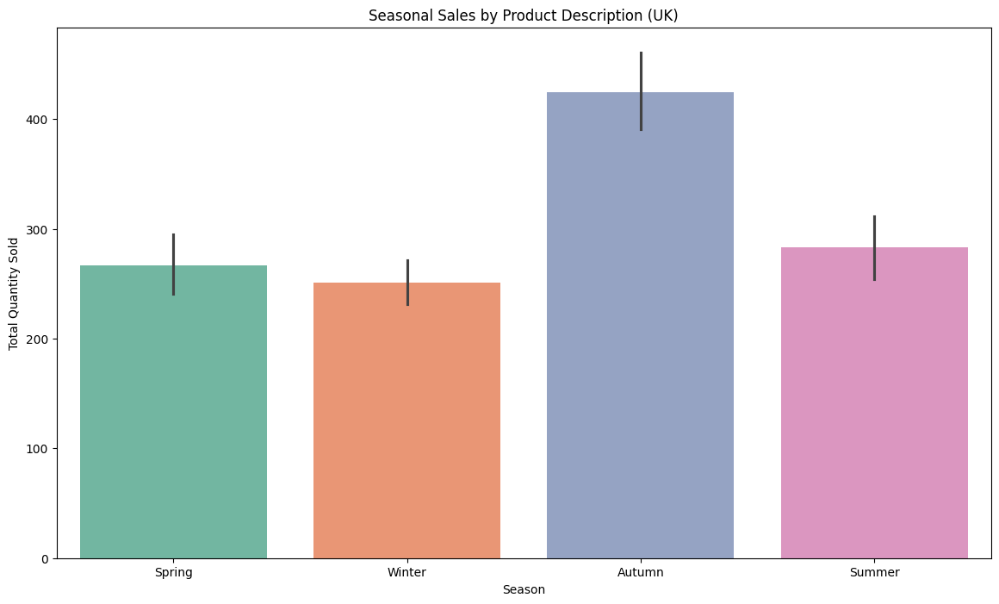

<ipython-input-42-2ed4700830a6>:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




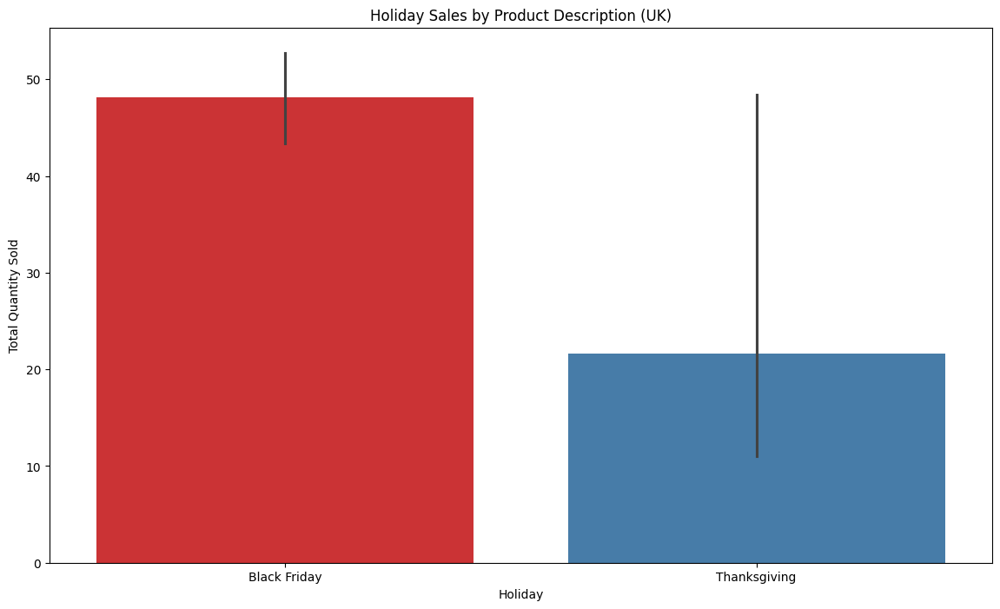

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot seasonal sales
plt.figure(figsize=(14, 8))
sns.barplot(data=seasonal_sales, x='Season', y='Quantity',  palette='Set2')
plt.title('Seasonal Sales by Product Description (UK)')
plt.xlabel('Season')
plt.ylabel('Total Quantity Sold')
#plt.legend(loc='upper right')
plt.show()

# Plot holiday sales
plt.figure(figsize=(14, 8))
sns.barplot(data=holiday_sales, x='Holiday', y='Quantity', palette='Set1')
plt.title('Holiday Sales by Product Description (UK)')
plt.xlabel('Holiday')
plt.ylabel('Total Quantity Sold')
#plt.legend(loc='upper right')
plt.show()



In [43]:
# Aggregate by StockCode, Description, and Season
seasonal_sales = df_stock.groupby(['StockCode', 'Description', 'Season']).agg({
    'Quantity': 'sum',
    'Total price': 'sum'
}).reset_index()

# Filter for top 100 products per season based on Quantity
top_products_per_season = seasonal_sales.groupby('Season').apply(lambda x: x.nlargest(100, 'Quantity')).reset_index(drop=True)

# Aggregate by StockCode, Description, and Holiday
holiday_sales = df_stock.groupby(['StockCode', 'Description', 'Holiday']).agg({
    'Quantity': 'sum',
    'Total price': 'sum'
}).reset_index()

# Filter out rows where Holiday is 'None'
holiday_sales = holiday_sales[holiday_sales['Holiday'] != 'None']

# Display the aggregated data
print("Seasonal Sales (Top 100 Products):")
print(top_products_per_season.head())
print("Holiday Sales:")
print(holiday_sales.head())


Seasonal Sales (Top 100 Products):
  StockCode                        Description  Season  Quantity  Total price
0     22197                     POPCORN HOLDER  Autumn     20634     21136.54
1     84077  WORLD WAR 2 GLIDERS ASSTD DESIGNS  Autumn     14958      3916.06
2    85099B            JUMBO BAG RED RETROSPOT  Autumn     13687     27230.57
3     22086    PAPER CHAIN KIT 50'S CHRISTMAS   Autumn     12638     42887.78
4     84826     ASSTD DESIGN 3D PAPER STICKERS  Autumn     12562        18.70
Holiday Sales:
   StockCode                   Description       Holiday  Quantity  \
10     10135  COLOURING PENCILS BROWN TUBE  Black Friday        31   
12     10135  COLOURING PENCILS BROWN TUBE  Thanksgiving        10   
13     11001   ASSTD DESIGN RACING CAR PEN  Black Friday        21   
15     11001   ASSTD DESIGN RACING CAR PEN  Thanksgiving         1   
17     15034   PAPER POCKET TRAVELING FAN   Black Friday        53   

    Total price  
10        55.69  
12        12.50  
13     

<ipython-input-43-c3bcf1f72169>:8: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



<ipython-input-44-4d87e91e7862>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




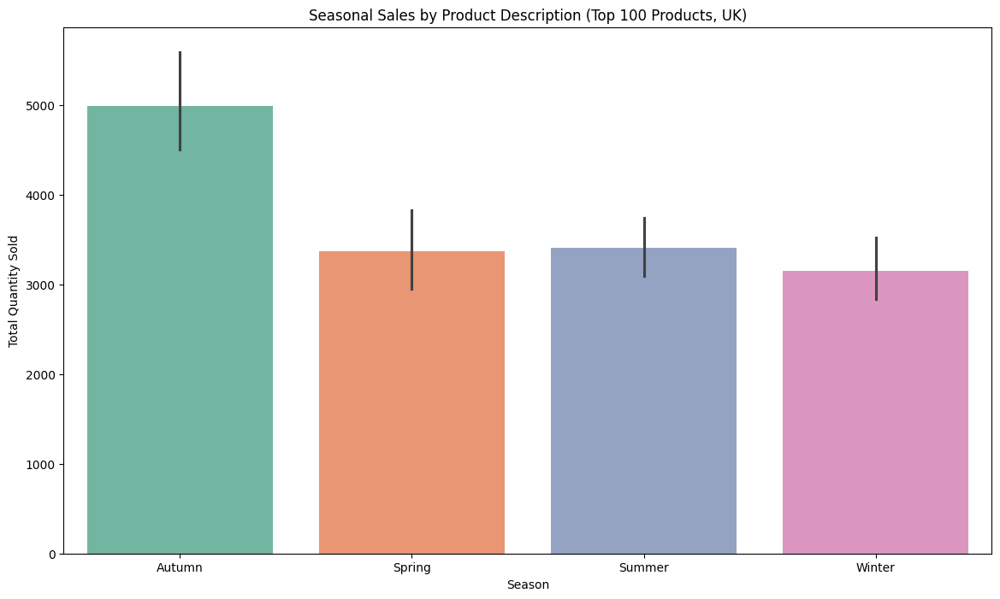

<ipython-input-44-4d87e91e7862>:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




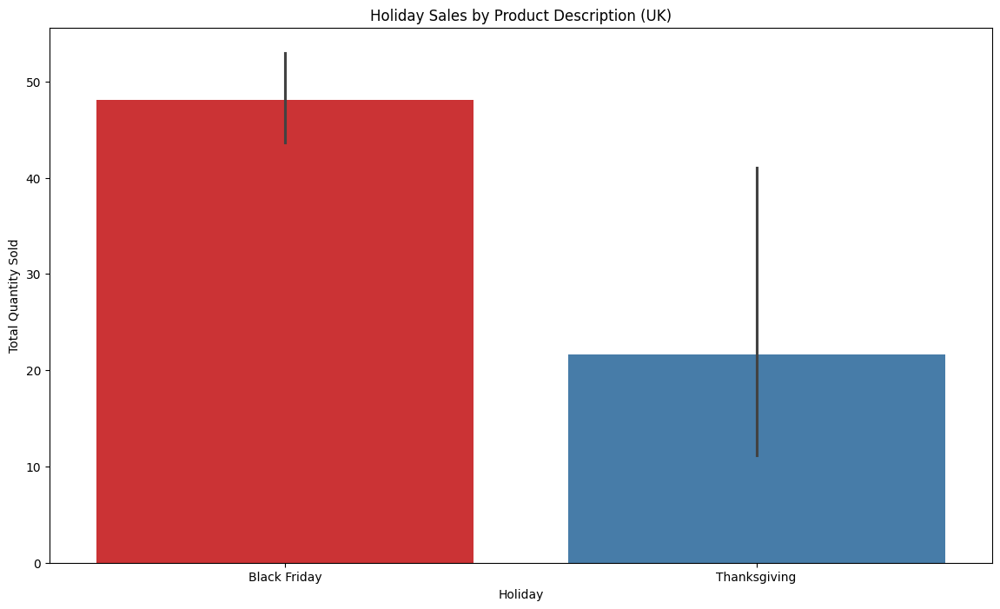

In [44]:
# Plot seasonal sales for top 100 products
plt.figure(figsize=(14, 8))
sns.barplot(data=top_products_per_season, x='Season', y='Quantity',  palette='Set2')
plt.title('Seasonal Sales by Product Description (Top 100 Products, UK)')
plt.xlabel('Season')
plt.ylabel('Total Quantity Sold')
#plt.legend(loc='upper right')
plt.show()

# Plot holiday sales
plt.figure(figsize=(14, 8))
sns.barplot(data=holiday_sales, x='Holiday', y='Quantity',  palette='Set1')
plt.title('Holiday Sales by Product Description (UK)')
plt.xlabel('Holiday')
plt.ylabel('Total Quantity Sold')
#plt.legend(loc='upper right')
plt.show()


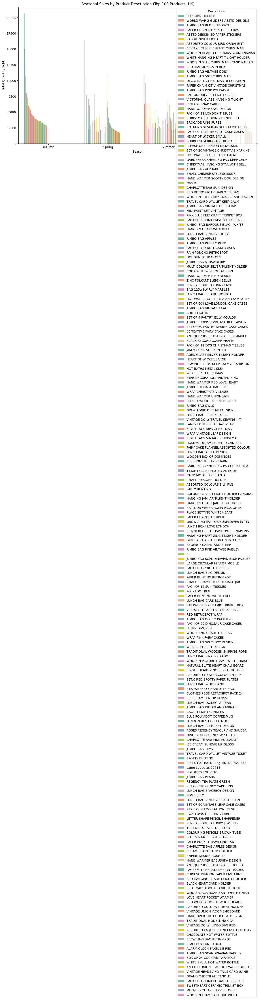

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot seasonal sales for top 100 products
plt.figure(figsize=(14, 8))
sns.barplot(data=top_products_per_season, x='Season', y='Quantity', hue='Description', palette='Set2')
plt.title('Seasonal Sales by Product Description (Top 100 Products, UK)')
plt.xlabel('Season')
plt.ylabel('Total Quantity Sold')
#plt.legend(loc='upper right')
plt.show()

# Plot holiday sales
plt.figure(figsize=(14, 8))
sns.barplot(data=holiday_sales, x='Holiday', y='Quantity', hue='Description', palette='Set1')
plt.title('Holiday Sales by Product Description (UK)')
plt.xlabel('Holiday')
plt.ylabel('Total Quantity Sold')
#plt.legend(loc='upper right')
plt.show()


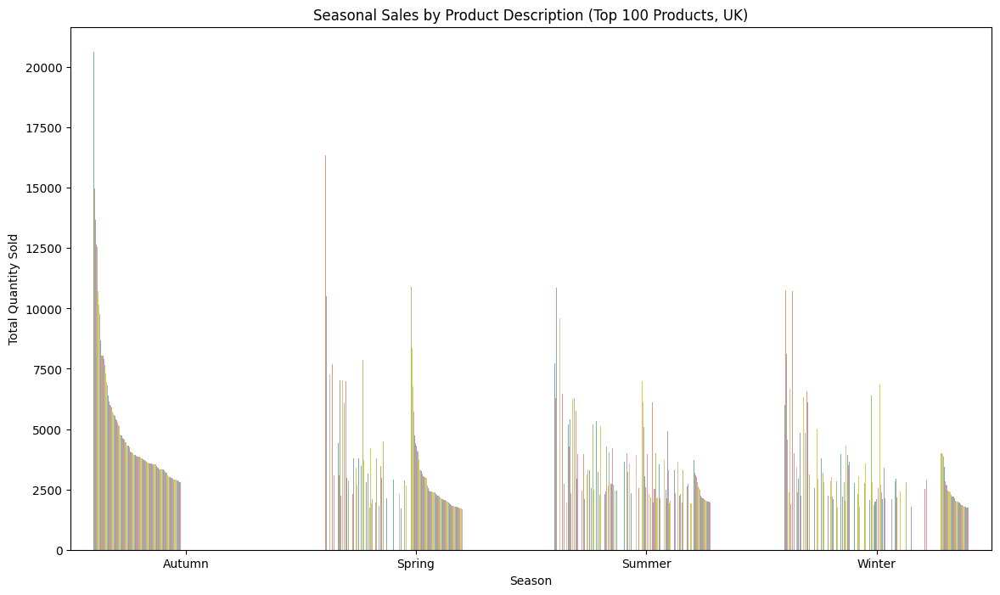

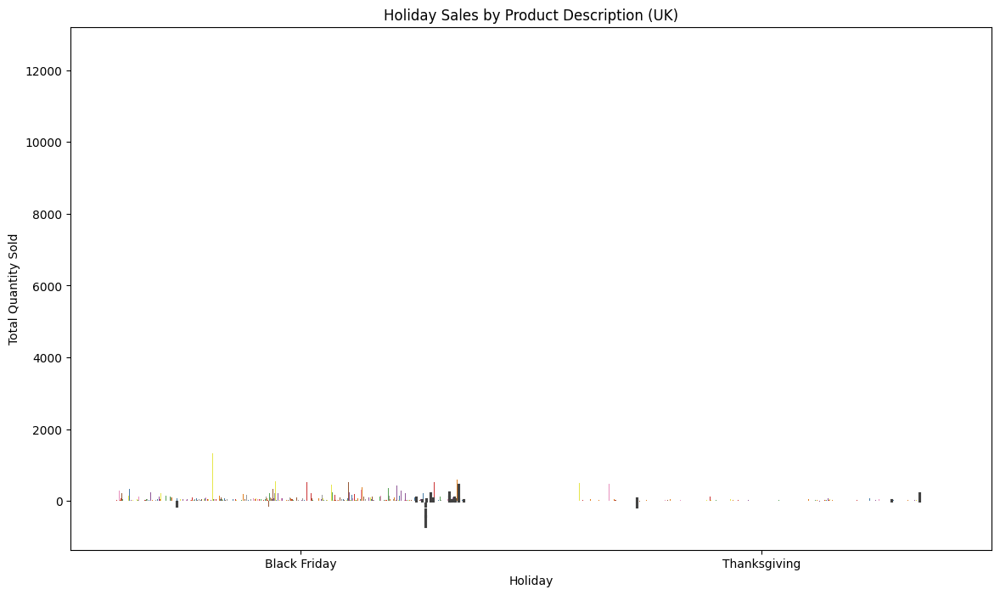

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot seasonal sales for top 100 products
plt.figure(figsize=(14, 8))
sns.barplot(data=top_products_per_season, x='Season', y='Quantity', hue='Description', palette='Set2')
plt.title('Seasonal Sales by Product Description (Top 100 Products, UK)')
plt.xlabel('Season')
plt.ylabel('Total Quantity Sold')
plt.legend([],[], frameon=False)  # Disable the legend
plt.show()

# Plot holiday sales
plt.figure(figsize=(14, 8))
sns.barplot(data=holiday_sales, x='Holiday', y='Quantity', hue='Description', palette='Set1')
plt.title('Holiday Sales by Product Description (UK)')
plt.xlabel('Holiday')
plt.ylabel('Total Quantity Sold')
plt.legend([],[], frameon=False)  # Disable the legend
plt.show()


In [46]:


# Predict future sales using a simple linear regression model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Prepare the features and target variable
X = df_stock[['InvoiceDate', 'Quantity']]
y = df_stock['Total price']

# Convert InvoiceDate to ordinal for regression
X['InvoiceDate'] = X['InvoiceDate'].apply(lambda date: date.toordinal())

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Predict on test set
y_pred = regressor.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 13602.785354578662
R-squared: -0.5516744946527885


<ipython-input-46-aeeb310e0bed>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [47]:
# Aggregate by StockCode, Description, and Season
seasonal_sales = df_stock.groupby(['StockCode', 'Description', 'Season']).agg({
    'Quantity': 'sum',
    'Total price': 'sum'
}).reset_index()

# Filter for top 100 products per season based on Quantity
top_products_per_season = seasonal_sales.groupby('Season').apply(lambda x: x.nlargest(100, 'Quantity')).reset_index(drop=True)

# Display the aggregated data for top 100 products per season
print("Top 100 Products per Season:")
print(top_products_per_season.head())



Top 100 Products per Season:
  StockCode                        Description  Season  Quantity  Total price
0     22197                     POPCORN HOLDER  Autumn     20634     21136.54
1     84077  WORLD WAR 2 GLIDERS ASSTD DESIGNS  Autumn     14958      3916.06
2    85099B            JUMBO BAG RED RETROSPOT  Autumn     13687     27230.57
3     22086    PAPER CHAIN KIT 50'S CHRISTMAS   Autumn     12638     42887.78
4     84826     ASSTD DESIGN 3D PAPER STICKERS  Autumn     12562        18.70


<ipython-input-47-ea8d55f1a2b6>:8: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [48]:
# Export the top 100 products per season to a CSV file
top_products_per_season.to_csv('top_100_products_per_season.csv', index=False)
print("Top 100 products per season have been exported to 'top_100_products_per_season.csv'.")



Top 100 products per season have been exported to 'top_100_products_per_season.csv'.


K-means Clustering and Determine Optimal Number of Clusters Using the Elbow Method

In [50]:
# Pivot the table to get seasons as columns
seasonal_sales_pivot = seasonal_sales.pivot_table(index=['StockCode', 'Description'],
                                                  columns='Season',
                                                  values='Quantity', fill_value=0).reset_index()
# Display the pivot table
print(seasonal_sales_pivot.head())

Season StockCode                  Description  Autumn  Spring  Summer  Winter
0          10002  INFLATABLE POLITICAL GLOBE      0.0    97.0     0.0   341.0
1          10080     GROOVY CACTUS INFLATABLE   157.0     0.0   144.0     2.0
2          10080                        check    22.0     0.0     0.0     0.0
3          10120                 DOGGY RUBBER    59.0    32.0    40.0    52.0
4         10123C        HEARTS WRAPPING TAPE      0.0     4.0     0.0     1.0


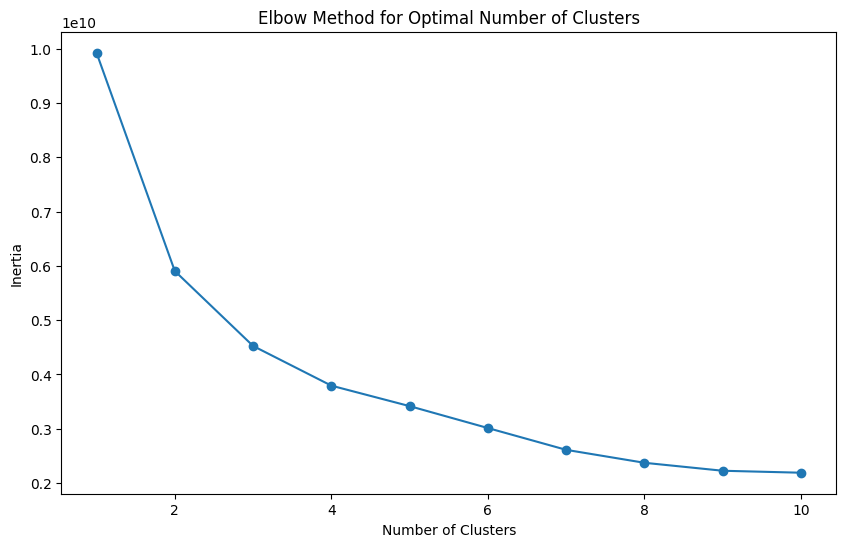

In [51]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt



# Determine the optimal number of clusters using the elbow method
X = seasonal_sales_pivot.drop(columns=['StockCode', 'Description']).values

inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

# Plot the elbow method
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()


In [53]:
# Apply K-means with the chosen number of clusters (e.g., 4)
kmeans = KMeans(n_clusters=4, random_state=42)
seasonal_sales_pivot['Cluster'] = kmeans.fit_predict(X)

# Display the clustered data
print(seasonal_sales_pivot.head())


Season StockCode                  Description  Autumn  Spring  Summer  Winter  \
0          10002  INFLATABLE POLITICAL GLOBE      0.0    97.0     0.0   341.0   
1          10080     GROOVY CACTUS INFLATABLE   157.0     0.0   144.0     2.0   
2          10080                        check    22.0     0.0     0.0     0.0   
3          10120                 DOGGY RUBBER    59.0    32.0    40.0    52.0   
4         10123C        HEARTS WRAPPING TAPE      0.0     4.0     0.0     1.0   

Season  Cluster  
0             1  
1             1  
2             1  
3             1  
4             1  


In [54]:
from sklearn.cluster import DBSCAN
import numpy as np

# Apply DBSCAN
dbscan = DBSCAN(eps=1.0, min_samples=5)
seasonal_sales_pivot['DBSCAN_Cluster'] = dbscan.fit_predict(X)

# Display the clustered data
print(seasonal_sales_pivot.head())


Season StockCode                  Description  Autumn  Spring  Summer  Winter  \
0          10002  INFLATABLE POLITICAL GLOBE      0.0    97.0     0.0   341.0   
1          10080     GROOVY CACTUS INFLATABLE   157.0     0.0   144.0     2.0   
2          10080                        check    22.0     0.0     0.0     0.0   
3          10120                 DOGGY RUBBER    59.0    32.0    40.0    52.0   
4         10123C        HEARTS WRAPPING TAPE      0.0     4.0     0.0     1.0   

Season  Cluster  DBSCAN_Cluster  
0             1              -1  
1             1              -1  
2             1               5  
3             1              -1  
4             1               0  


In [55]:
from sklearn.cluster import KMeans

# Apply K-means with k=5
kmeans = KMeans(n_clusters=5, random_state=42)
seasonal_sales_pivot['KMeans_Cluster'] = kmeans.fit_predict(seasonal_sales_pivot.drop(columns=['StockCode', 'Description']))

# Display the clustered data
print(seasonal_sales_pivot.head())


Season StockCode                  Description  Autumn  Spring  Summer  Winter  \
0          10002  INFLATABLE POLITICAL GLOBE      0.0    97.0     0.0   341.0   
1          10080     GROOVY CACTUS INFLATABLE   157.0     0.0   144.0     2.0   
2          10080                        check    22.0     0.0     0.0     0.0   
3          10120                 DOGGY RUBBER    59.0    32.0    40.0    52.0   
4         10123C        HEARTS WRAPPING TAPE      0.0     4.0     0.0     1.0   

Season  Cluster  DBSCAN_Cluster  KMeans_Cluster  
0             1              -1               1  
1             1              -1               1  
2             1               5               1  
3             1              -1               1  
4             1               0               1  


In [56]:
from sklearn.cluster import DBSCAN
import numpy as np

# Apply DBSCAN
dbscan = DBSCAN(eps=1.0, min_samples=5)
seasonal_sales_pivot['DBSCAN_Cluster'] = dbscan.fit_predict(seasonal_sales_pivot.drop(columns=['StockCode', 'Description']))

# Display the clustered data
print(seasonal_sales_pivot.head())


Season StockCode                  Description  Autumn  Spring  Summer  Winter  \
0          10002  INFLATABLE POLITICAL GLOBE      0.0    97.0     0.0   341.0   
1          10080     GROOVY CACTUS INFLATABLE   157.0     0.0   144.0     2.0   
2          10080                        check    22.0     0.0     0.0     0.0   
3          10120                 DOGGY RUBBER    59.0    32.0    40.0    52.0   
4         10123C        HEARTS WRAPPING TAPE      0.0     4.0     0.0     1.0   

Season  Cluster  DBSCAN_Cluster  KMeans_Cluster  
0             1              -1               1  
1             1              -1               1  
2             1               5               1  
3             1              -1               1  
4             1               0               1  


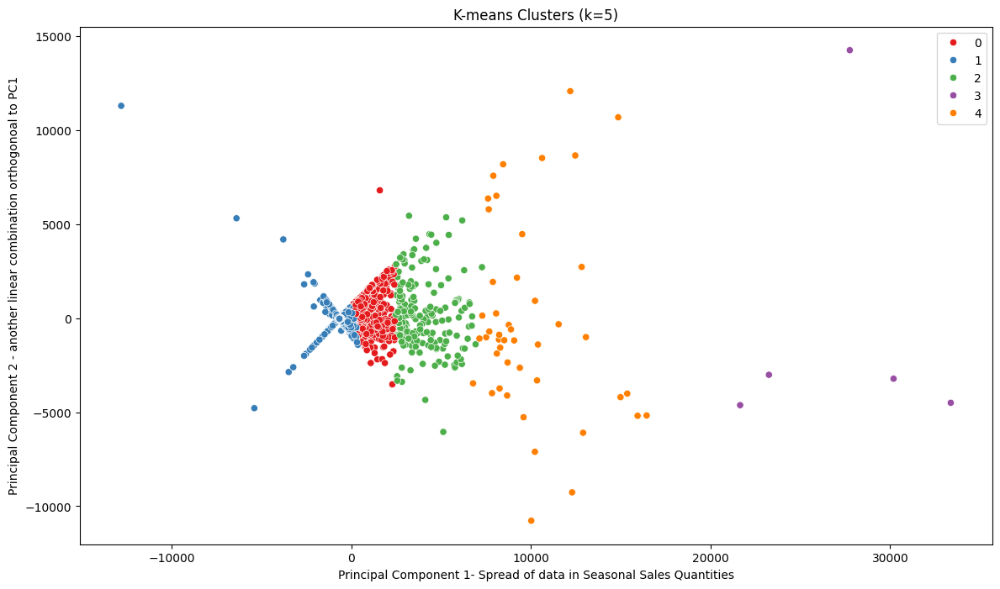

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Perform PCA for visualization
pca = PCA(n_components=2)
seasonal_sales_pivot[['PC1', 'PC2']] = pca.fit_transform(seasonal_sales_pivot.drop(columns=['StockCode', 'Description', 'KMeans_Cluster', 'DBSCAN_Cluster']))

# Plot K-means clusters
plt.figure(figsize=(14, 8))
sns.scatterplot(data=seasonal_sales_pivot, x='PC1', y='PC2', hue='KMeans_Cluster', palette='Set1')
plt.title('K-means Clusters (k=5)')
plt.xlabel('Principal Component 1- Spread of data in Seasonal Sales Quantities')
plt.ylabel('Principal Component 2 - another linear combination orthogonoal to PC1')
plt.legend()
plt.show()

# Plot DBSCAN clusters
#plt.figure(figsize=(14, 8))
#sns.scatterplot(data=seasonal_sales_pivot, x='PC1', y='PC2', hue='DBSCAN_Cluster', palette='Set2')
#plt.title('DBSCAN Clusters')
#plt.xlabel('Principal Component 1 - Spread of data in Seasonal Sales Quantities')
#plt.ylabel('Principal Component 2 - Principal Component 2 - another linear combination orthogonoal to PC1')
#plt.legend()
#plt.show()
